In [36]:
####################################
# Plot supplementary figures for paper 3(20240910 version of the paper text and figures)
# Fig. S1-S9: KW composite QTFU for each season (total and 2nd mode)
# Mu-Ting Chien
# 2024.9.16
#####################################################

In [37]:
import numpy as np
import numpy.matlib as matlib
from netCDF4 import Dataset
import matplotlib.pyplot as plt
import os
from matplotlib.cm import get_cmap
import sys
sys.path.append('/home/disk/eos4/muting/function/python/')
import create_my_colormap as mycolor
RWB = mycolor.red_white_blue()
import KW_diagnostics as KW
os.environ["PROJ_LIB"] = r'/home/disk/p/muting/anaconda3/share/proj/'#' (location of epsg-->You need to change your own directory, this may vary among machines)'    
from mpl_toolkits.basemap import Basemap, addcyclic, shiftgrid # for fig. S1 (kw Tb map)
from wrf import (getvar, to_np, vertcross, smooth2d,CoordPair, get_basemap, latlon_coords) # for fig. S1 (kw Tb map)
import statsmodels.api as sm # for fig. S8-9 (scatter plot)

In [38]:
DIR     = '/home/disk/eos4/muting/'
dir_out = DIR+'KW/'
fig_dir = dir_out+'figure/RA_EAPEG_EKEG/post_general_exam/paper3_fig_20240910/Supplement/'
os.makedirs(fig_dir, exist_ok=True)
##########################
# Origianl data location: 
#dir_in0 = DIR+'mesoscale_CCEW/'
#dir_out2 = dir_out+'output_data/RA_EAPEG_EKEG/3hr/final_5reg/'
#dir_out2_org = dir_out+'output_data/RA_EAPEG_EKEG/3hr/final/'
##################################
# Copied data location:
dir_in = dir_out+'output_data/RA_EAPEG_EKEG/paper3_final_20240910/'

pi = np.pi
PI = '\u03C0'
bin_simple = np.arange(-pi,pi+1/4*pi,1/4*pi)
bin_simple_sparse = np.arange(-pi,pi+1/2*pi,1/2*pi)
bin_simple2 = np.arange(-pi,pi+1/2*pi,1/2*pi)
color_list = list(['orange','g','dodgerblue','m'])

lon_ref = np.array([55,130,250,345]) # marking the boundary of each region
dx      = 2.5
lon_max2 = np.array([130, 250, 345, 55-dx, 360])
lon_ref3 = np.array([55,130,250,345])+dx # marking the boundary of each region

region_abc = list(['(a) IO','(b) WP-CP','(c) EP-ATL','(d) AFR'])

In [39]:
############################################
# Load data for Fig. S1 (KW-filtered Tb map)
#############################################
ymin  = 1998
nyr_leap = 5 # 5 leap years between 1980 and ymin
trange = '1983_2013' #file name for KW phase

#file   = dir_in0+'output_data/Tb_15NS_CCKW_filt_1983_2013_3hr.nc'
file   = dir_in+'Tb_15NS_CCKW_filt_1983_2013_3hr.nc'
data   = Dataset(file,'r',format='NETCDF4')
time_kw  = data.variables['time'][:]
lon      = data.variables['lon'][:]
tmin_day = (ymin-1980)*365+nyr_leap
itmin    = np.argwhere(time_kw==tmin_day).squeeze()
lat      = data.variables['lat'][:]
Tb_kw    = data.variables['Tb_kw'][itmin:,:,:]
time_kw  = time_kw[itmin:]
time_kw  = time_kw[8:-8] # This is to make sure having the same time dimension as the composited variable (u, F, q...)
Tb_kw    = Tb_kw[8:-8,:,:]

# Tb std for each longitude and latitude (only within 10S to 10N)
Tb_std = np.std(Tb_kw,0) #(lon, lat)

# Meridional projection of Tb
Tb_proj = KW.KW_meridional_projection(Tb_kw, lat, tropics_or_midlat=0)
Tb_proj_std = np.std(Tb_proj,0)

In [40]:
#############################################
# Load data for Fig. S2 (KW statistics), region for Fig. S1 (KW Tb map), 
# , and KW amplitude for Fig. S8-9 (Scatter plot between amplitude and growth rate)
##############################################
# Load KW case number and amplitude (statistics for Fig.S2)
#data = np.load(dir_out2+'kwcomposite_2D_region_season.npz')
data = np.load(dir_in+'kwcomposite_2D_region_season.npz')
region      = data['region'] # also for fig. S1
season      = data['season']
nreg        = np.size(region)
nsea        = np.size(season)
Tb_KW_small = data['Tb_KW_small'] #(phase, reg, season)
kw_number   = data['kw_number'] #(reg, season)
pr_KW_small = data['pr_KW_small']
Tb_KW_amp = ( -np.min(Tb_KW_small,0)+np.max(Tb_KW_small,0) )/2
pr_KW_amp = ( -np.min(pr_KW_small,0)+np.max(pr_KW_small,0) )/2

kw_number_new = np.empty([5,5])
kw_number_new[:,:-1] = kw_number[:,:-1]
kw_number_new[:,-1]  = kw_number[:,-1]/4

In [41]:
#############################################
# Load data for Fig. S3-S7 (Regional and seasonal KW composite and vertical mode decomposition)
#############################################
# Load Q,T,F,U kw composite 
#data       = np.load(dir_out2+'kwcomposite_3D_region_season.npz')
data       = np.load(dir_in+'kwcomposite_3D_region_season.npz')
plev       = data['plev'][1:-1]
region     = data['region']
season     = data['season']
T_KW_small = data['T_KW_small'][:,1:-1,:,:]
Q_KW_small = data['Q_KW_small'][:,1:-1,:,:]
F_KW_small = data['F_KW_small'][:,1:-1,:,:]
U_KW_small = data['U_KW_small'][:,1:-1,:,:]
nsea       = np.size(season)
nreg       = np.size(region)
nlev       = np.size(plev)

# Load Q,T,F,U vmd output
#data = np.load(dir_out2+'kwcomposite_3D_region_season_QTFU_vmd_updated.npz')
data = np.load(dir_in+'kwcomposite_3D_region_season_QTFU_vmd_updated.npz')
plev = data['plev']
Q1_KW_small = data['Q1_KW_small']
Q2_KW_small = data['Q2_KW_small']
T1_KW_small = data['T1_KW_small']
T2_KW_small = data['T2_KW_small']
F1_KW_small = data['F1_KW_small']
F2_KW_small = data['F2_KW_small']
U1_KW_small = data['U1_KW_small']
U2_KW_small = data['U2_KW_small']

# Load phase bin
#data = np.load(dir_out2_org+'KW_composite_2D_LHpr.npz')
data = np.load(dir_in+'KW_composite_2D_LHpr.npz')
phase = data['phase']
nphase = np.size(phase)

In [42]:
###############################
# Load data for Fig. S8-9 (Scatter plot)
####################################
# Load growth rate
#data      = np.load(dir_out2+'EAPE_EKE_growth_rate_region_season_updated.npz')
data      = np.load(dir_in+'EAPE_EKE_growth_rate_region_season_updated.npz')
EAPEGR1   = data['EAPEGR1']
EAPEGR2   = data['EAPEGR2']
EKEGR1    = data['EKEGR1']
EKEGR2    = data['EKEGR2']
EKEGR2_EAPEGR2 = EKEGR2/EAPEGR2

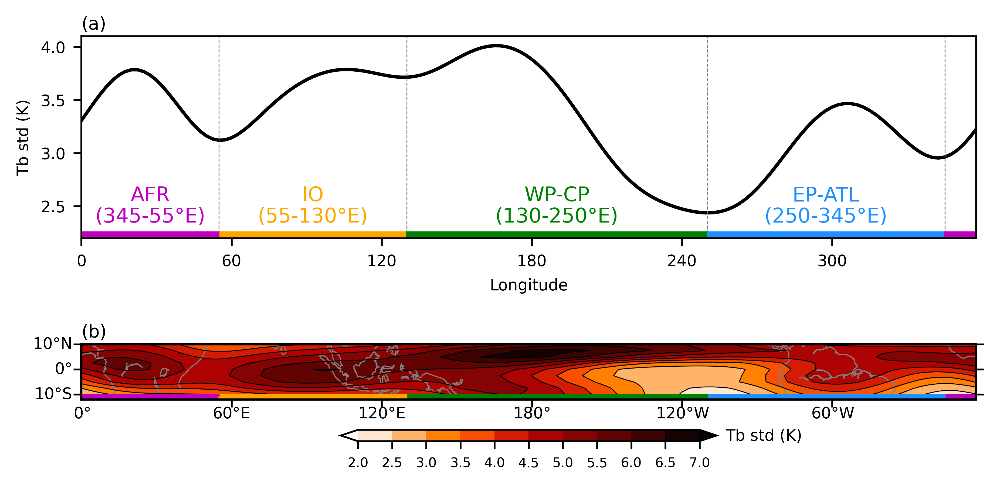

In [43]:
###################################################
# Fig. S1: Map of KW Tb std and Tbstd longitudinal structure
###############################################
pltname = list(['(a)','(b)'])
fig,axes = plt.subplots(2,1,figsize=(6.5, 3.2),dpi=600)
font = 7
plt.subplots_adjust(left=0.1,right=0.95,top=0.9,bottom=0.1,hspace=0.05)
plt.rcParams.update({'font.size': font})
#
# 1. plot line plot of Tb std
plt.subplot(2,1,1)
plt.plot(lon, Tb_proj_std, 'k')
for i in range(0,np.size(lon_ref)):
    plt.plot([lon_ref[i],lon_ref[i]],[2.2,4.1],color='grey',linestyle='dashed',linewidth=0.4)
    if i!=3:
        plt.plot([lon_ref3[i],lon_max2[i]],[2.2,2.2],color=color_list[i],linewidth=6)
        #print(lon_ref[i],lon_ref3[i],lon_max2[i])
    else:
        plt.plot([0,lon_max2[i]],[2.2,2.2],color=color_list[i],linewidth=6)
        plt.plot([lon_ref3[i],np.max(lon)],[2.2,2.2],color=color_list[i],linewidth=6)

lon_mid = np.empty([4])
lon_name = list(['(55-130\u00b0E)','(130-250\u00b0E)','(250-345\u00b0E)','(345-55\u00b0E)'])
region_longname = list(['IO (55-130\u00b0E)','WP-CP (130-250\u00b0E)','EP-ATL (250-345\u00b0E)','AFR (345-55\u00b0E)'])
for ireg in range(0,4):
    if ireg != 3:
        lon_mid[ireg] = (lon_ref[ireg]+lon_ref[ireg+1])/2
    else:
        lon_mid[ireg] = (0+lon_ref[0])/2
    #plt.text(lon_mid[ireg],2.4,region_longname[ireg],color=color_list[ireg],fontsize=7.7,horizontalalignment='center',verticalalignment='center')
    plt.text(lon_mid[ireg],2.6,region[ireg],color=color_list[ireg],fontsize=9,horizontalalignment='center',verticalalignment='center')
    plt.text(lon_mid[ireg],2.4,lon_name[ireg],color=color_list[ireg],fontsize=9,horizontalalignment='center',verticalalignment='center')
plt.xlabel('Longitude')
plt.ylabel('Tb std (K)')
ax = plt.gca()
ax.set_title(pltname[0], pad=3,loc='left',fontsize=8)
#plt.title('Tb std from 1998-2013, meridionally projected')
plt.xticks(np.arange(0,360,60))
plt.xlim([0,np.max(lon)])
plt.ylim([2.2,4.1])
#
# 2. plot map of Tb std
axes = plt.subplot(2,1,2)
lon_ticks = np.arange(0,360,60)
lon_ticks1 = np.arange(60,360,60)
lat_ticks = np.arange(-10,20,10)
c_coast = 'grey' #color of the coast line
latbd = 10 #matimum latitude of your plot (15S-15N)
vmax = 1

cf_var = list(['Tb_std'])
color = 'gist_heat_r'#'hot_r'
clev = np.arange(2,7.5,0.5)#np.arange(1,2,0.1)
ticks = clev #np.arange(1,2,0.2)
plt_contour = 1
if plt_contour == 1:
    cn_var = cf_var
    clev_cn = clev
    cncolor ='k'
CLEV = 1 # or 0
ref = 1 # or 0, plot ref point
bm = 1
if ref == 1:
    lat_ref = np.empty([nreg])
    lat_ref[:] = 0
    
for v in range(0,vmax):
    ax = plt.gca()
    temp = globals() [cf_var[v]]
    if plt_contour == 1:
        temp2 = globals() [cn_var[v]]
    ax.set_title(pltname[1], pad=3,loc='left',fontsize=8)
    m = Basemap(projection='merc', llcrnrlat=-latbd-2, urcrnrlat=latbd,\
            llcrnrlon=lon[0],urcrnrlon=lon[-1],lat_ts=20,resolution='c') 
    lon2d,lat2d = np.meshgrid(lon,lat)
    x,y = m(to_np(lon2d), to_np(lat2d))
    if CLEV == 1:
        cf = m.contourf(x, y, temp, levels = clev, cmap=get_cmap(color), zorder=2, alpha=0.99,extend = 'both')
    else:
        cf = m.contourf(x, y, temp,  cmap=get_cmap(color), zorder=2, alpha=0.99,extend = 'both')
    
    ######################################
    lon_ticks_proj, _=m(lon_ticks1, np.zeros(len(lon_ticks1)))
    _, lat_ticks_proj=m(np.zeros(len(lat_ticks)), lat_ticks)
    # manually add ticks
    ax.set_xticks(lon_ticks_proj)
    ax.set_yticks(lat_ticks_proj)
    ax.tick_params(axis='both',which='major')
    # add ticks to the opposite side as well
    ax.xaxis.set_ticks_position('bottom')
    ax.yaxis.set_ticks_position('both')    
    # remove the tick labels
    ax.xaxis.set_ticklabels([])
    ax.yaxis.set_ticklabels([])
    ##############################################
    m.drawcoastlines(color=c_coast,linewidth=0.5)
    if v == vmax-1:
        m.drawmeridians(lon_ticks,labels=[False, False, False, True],\
                    yoffset=0.12*abs(m.ymax-m.ymin),linewidth=0,fontsize=7)  
    elif v == 0:
        m.drawmeridians(lon_ticks,labels=[False, False, False, False],\
                    yoffset=0.12*abs(m.ymax-m.ymin),linewidth=0,fontsize=7) 
    m.drawparallels(lat_ticks,labels=[True, False, False, False],\
                    xoffset=0.01*abs(m.xmax-m.xmin),linewidth=0,fontsize=7)
    m.drawmapboundary(fill_color='white')    
    if plt_contour ==1:
        plt.contour(x,y,temp2,levels=clev_cn,linewidths=0.4, colors=cncolor) 
    
    if ref == 1:
        # Regions except Afr
        for p in range(0,3):#np.size(lon_ref)):
            lon2 = np.array([lon_ref3[p],lon_max2[p]])
            lat2 = np.array([-10,-10])-2
            xp, yp = m(lon2,lat2)
            m.plot(xp, yp, color=color_list[p], linewidth=5)
        # Afr
        lon2 = np.array([0,lon_max2[3]])
        lat2 = np.array([-10,-10])-2
        xp, yp = m(lon2,lat2)
        m.plot(xp, yp, color=color_list[3], linewidth=5)        
        lon2 = np.array([lon_ref3[3],np.max(lon)])
        lat2 = np.array([-10,-10])-2
        xp, yp = m(lon2,lat2)
        m.plot(xp, yp, color=color_list[3], linewidth=5)  
        
if vmax!=1:
    cb = fig.colorbar(cf,ax=axes[0:vmax],orientation = 'horizontal',shrink=.42,\
                fraction=0.1, pad=0.1) #colorbar only shows on the last row
else:
    cb = fig.colorbar(cf,ax=axes,orientation = 'horizontal',shrink=.42, fraction=0.1, pad=0.15, aspect=30)     
cb.ax.tick_params(labelsize=5.9)
if CLEV == 1:
    cb.set_ticks(ticks)  
ax.text(0.72, -0.8, 'Tb std (K)',\
    verticalalignment='bottom', horizontalalignment='left',transform=ax.transAxes,\
    color='k', fontsize=7) #unit of the colorbar
plt.savefig(fig_dir+'FigS1_Tb_std_map_lon.png',dpi=600)
plt.show()

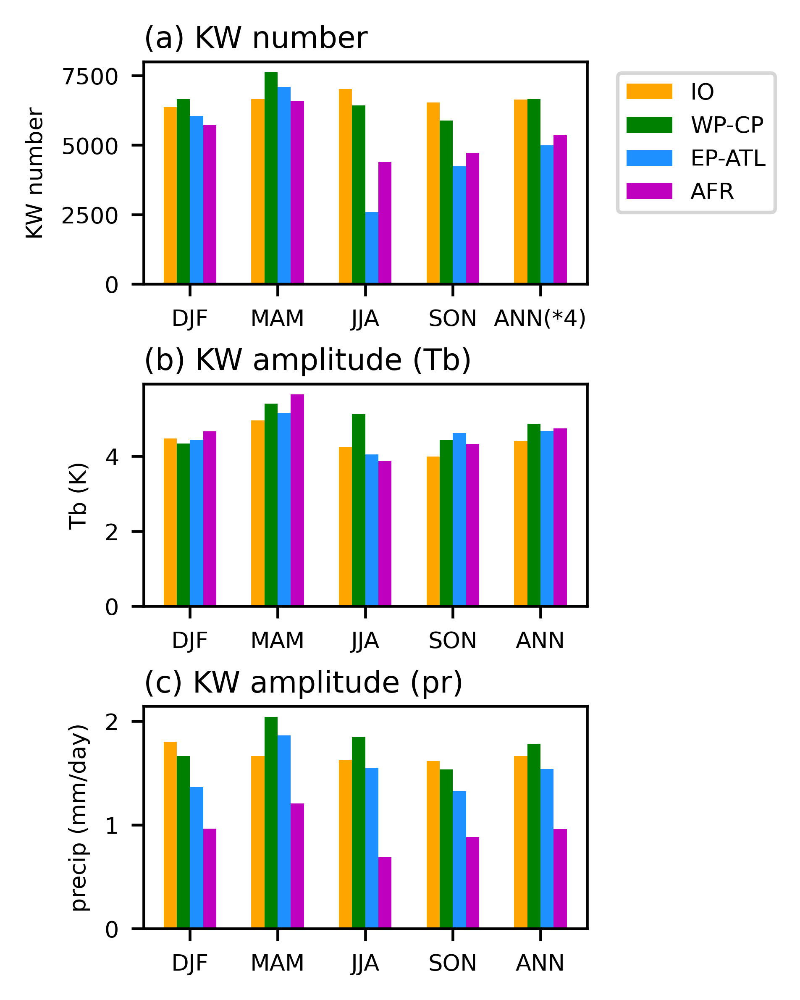

In [44]:
#############################
# Fig. S2 (KW statistics)
####################################
# Plot KW number 
vname_list = list(['kw_number_new','Tb_KW_amp','pr_KW_amp'])
ylabel_list = list(['KW number','Tb (K)',\
                   'precip (mm/day)'])
title_list = list(['(a) KW number','(b) KW amplitude (Tb)',\
                   '(c) KW amplitude (pr)'])
x = np.arange(0,5)

font = 6.5
fig,axes = plt.subplots(3,1,figsize=(3.2, 4),dpi=600)
plt.subplots_adjust(left=0.2,right=0.75, top=0.93,bottom=0.07,hspace=0.45) 
plt.rcParams.update({'font.size': font})
for iplt in range(0,3):
    plt.subplot(3, 1, iplt+1)
    ax = plt.gca()
    r = globals()[vname_list[iplt]]
    dx = 0.15    
    plt.bar(x, r[0, :], color='orange',width=dx) #color='darkblue'
    plt.bar(x+dx, r[1, :], color='green',width=dx)
    plt.bar(x+dx*2, r[2, :], color='dodgerblue',width=dx)
    plt.bar(x+dx*3, r[3, :], color='m',width=dx)
    if iplt == 0:
        ax.legend(region, bbox_to_anchor=(1.45, 1), loc='upper right',fontsize=font)
    if iplt != 0:
        plt.xticks(x+dx*1.5,('DJF','MAM','JJA','SON','ANN'),fontsize=font)
    else:
        plt.xticks(x+dx*1.5,('DJF','MAM','JJA','SON','ANN(*4)'),fontsize=font)
    plt.ylabel(ylabel_list[iplt],fontsize=font)
    plt.title(title_list[iplt], pad=4, loc='left',fontsize=8.5)

plt.savefig(fig_dir+'FigS2_kw_statistics.png',dpi=600)
plt.show()

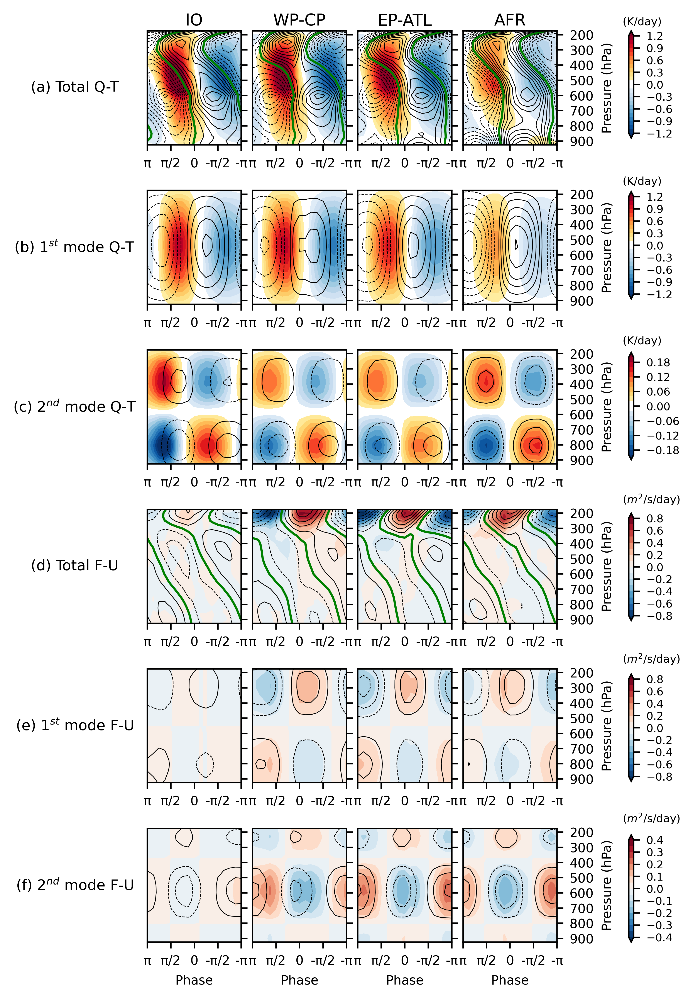

In [45]:
#########################################
# Fig. S2. Plot vertical mode decomposition: (ANN for each region)
###########################################
plot_fignum = 6 # or 5, if plot_fignum=5, plot extra panels for 1st+2nd modes and residual
txt_xloc = -8
txt_yloc = (np.min(plev)+np.max(plev))/2
row_name_QT = list(['(a) Total Q-T','(b) 1$^{st}$ mode Q-T','(c) 2$^{nd}$ mode Q-T'])
row_name_FU = list(['(d) Total F-U','(e) 1$^{st}$ mode F-U','(f) 2$^{nd}$ mode F-U'])
title_noabc = region
clev_0 = 0
font = 7
fig_indx = np.array([[5,17],[9,21]])
unit = list(['K/day','$m^{2}$/s/day'])


for isea in range(nsea-1,nsea): # only ANN
    
    fig,axes = plt.subplots(plot_fignum,nreg-1,figsize=(5.5, 8.2),dpi=600)
    plt.subplots_adjust(left=0.23,right=0.8,top=0.95,bottom=0.1,hspace=0.4,wspace=0.12)
    plt.rcParams.update({'font.size': font})
    
    for iplt in range(0,2): #(iplt=0, QT, iplt=1, FU)

        if iplt == 0:
            clev_n = np.arange(-6,0,0.5)/20
            clev_p = np.arange(0.5,6.5,0.5)/20
            clev   = np.arange(-1.2,1.3,0.1) # Total
            clev2  = np.arange(-0.2,0.22,0.02) # 2nd mode
            var_cf  = globals()['Q_KW_small']
            var_cn  = globals()['T_KW_small']
            var1_cf = globals()['Q1_KW_small']
            var2_cf = globals()['Q2_KW_small']
            var1_cn = globals()['T1_KW_small']
            var2_cn = globals()['T2_KW_small']
        elif iplt == 1:
            clev_n = np.arange(-2.2,0,0.2)*1.5#*1.5#*1.5 #4.5,0,0.5)
            clev_p = np.arange(0.2,2.2,0.2)*1.5#*1.5#*1.5 #(0.5,5,0.5)    
            clev  = np.arange(-0.8,0.9,0.1) # Total
            clev2 = np.arange(-0.4,0.45,0.05) # 2nd mode
            var_cf = globals()['F_KW_small']*86400
            var_cn = globals()['U_KW_small']
            var1_cf = globals()['F1_KW_small']*86400
            var2_cf = globals()['F2_KW_small']*86400
            var1_cn = globals()['U1_KW_small']
            var2_cn = globals()['U2_KW_small']

        for i in range(0,nreg-1): #iregion

            # Total
            ifig = i+1+iplt*12
            plt.subplot(plot_fignum,nreg-1, ifig)
            ax = plt.gca()
            if iplt == 0:
                plt.title(title_noabc[i], pad=3, loc='center',fontsize=9)
            xx, yy = np.meshgrid(phase, plev)
            if iplt == 0:
                cf  = plt.contourf(xx, yy, var_cf[:,:,i,isea].T, levels=clev, cmap=get_cmap(RWB), extend='both' )
            else:
                cf  = plt.contourf(xx, yy, var_cf[:,:,i,isea].T, levels=clev, cmap='RdBu_r', extend='both' )
            cn_p = plt.contour(xx, yy, var_cn[:,:,i,isea].T, levels=clev_p, colors='k', linewidths=0.4)
            cn_0 = plt.contour(xx, yy, var_cn[:,:,i,isea].T, levels=clev_0, colors='g', linewidths=1.2)
            cn_n = plt.contour(xx, yy, var_cn[:,:,i,isea].T, levels=clev_n, colors='k', linestyles='dashed',linewidths=0.4)
            plt.ylim([np.min(plev),np.max(plev)])
            plt.yticks(np.arange(200,1000,100))
            plt.gca().invert_yaxis()
            plt.xticks(bin_simple2,(PI,PI+'/2','0','-'+PI+'/2','-'+PI),fontsize=font)
            #plt.xticks(bin_simple2,('-'+PI,'-'+PI+'/2','0',PI+'/2',PI),fontsize=font)
            plt.tick_params(bottom=True,top=False,left=False,right=True)
            if iplt == 0:
                row_name = row_name_QT[0]
            else:
                row_name = row_name_FU[0]
            if i == 0:
                plt.tick_params(labelbottom=True,labeltop=False,labelleft=False,labelright=False)
                plt.text(txt_xloc,txt_yloc,row_name,fontsize=8,horizontalalignment='center',verticalalignment='center') 
            elif i == 1 or i == 2:
                plt.tick_params(labelbottom=True,labeltop=False,labelleft=False,labelright=False)
            elif i == 3:
                plt.tick_params(labelbottom=True,labeltop=False,labelleft=False,labelright=True)
                ax.yaxis.set_label_position("right")
                ax.set_ylabel('Pressure (hPa)',fontsize=font)
        cb = plt.colorbar(cf,ax=axes[iplt*2,:],orientation = 'vertical', shrink=.6, aspect=20,pad=0.6) 
        if iplt == 0:
            cb.ax.set_position([0.9, 0.85, 0.4, 0.1]) 
        else:
            cb.ax.set_position([0.9, 0.4, 0.4, 0.1]) 
        cb.ax.tick_params(labelsize=6)        
        # Add unit for colorbar
        ax.text(1.7, 1.03, '('+unit[iplt]+')',\
        verticalalignment='bottom', horizontalalignment='left',transform=ax.transAxes,\
        color='k', fontsize=6) #unit of the colorbar
        
        
        for irow in range(0,2): # 1st or 2nd mode
            for i in range(0,nreg-1): #iregion
                # 1st or 2nd mode
                ifig = fig_indx[irow, iplt]
                plt.subplot(plot_fignum, nreg-1, ifig+i)
                ax = plt.gca()
                
                # 1st mode:
                if iplt == 0 and irow == 0:
                    cf  = plt.contourf(xx, yy, var1_cf[:,:,i,isea].T, levels=clev, cmap=get_cmap(RWB), extend='both' )
                elif iplt == 1 and irow == 0:
                    cf  = plt.contourf(xx, yy, var1_cf[:,:,i,isea].T, levels=clev, cmap='RdBu_r', extend='both' )
                
                # 2nd mode:
                if iplt == 0 and irow == 1:
                    cf  = plt.contourf(xx, yy, var2_cf[:,:,i,isea].T, levels=clev2, cmap=get_cmap(RWB), extend='both' )
                elif iplt == 1 and irow == 1:
                    cf  = plt.contourf(xx, yy, var2_cf[:,:,i,isea].T, levels=clev2, cmap='RdBu_r', extend='both' )

                if irow == 0:
                    cn_p = plt.contour(xx, yy, var1_cn[:,:,i,isea].T, levels=clev_p, colors='k', linewidths=0.4)
                    cn_n = plt.contour(xx, yy, var1_cn[:,:,i,isea].T, levels=clev_n, colors='k', linestyles='dashed',linewidths=0.4) 
                else:
                    cn_p = plt.contour(xx, yy, var2_cn[:,:,i,isea].T, levels=clev_p, colors='k', linewidths=0.4)
                    cn_n = plt.contour(xx, yy, var2_cn[:,:,i,isea].T, levels=clev_n, colors='k', linestyles='dashed',linewidths=0.4)                     
                
                plt.ylim([np.min(plev),np.max(plev)])
                plt.yticks(np.arange(200,1000,100))
                plt.gca().invert_yaxis()
                plt.xticks(bin_simple2,(PI,PI+'/2','0','-'+PI+'/2','-'+PI),fontsize=font)
                plt.tick_params(bottom=True,top=False,left=False,right=True)
                if iplt == 0:
                    row_name = row_name_QT[irow+1]
                else:
                    row_name = row_name_FU[irow+1]
                if i == 0:
                    plt.tick_params(labelbottom=True,labeltop=False,labelleft=False,labelright=False)
                    plt.text(txt_xloc,txt_yloc,row_name,fontsize=8,horizontalalignment='center',verticalalignment='center') 
                elif i == 1 or i == 2:
                    plt.tick_params(labelbottom=True,labeltop=False,labelleft=False,labelright=False)
                elif i == 3:
                    plt.tick_params(labelbottom=True,labeltop=False,labelleft=False,labelright=True)
                    ax.yaxis.set_label_position("right")
                    ax.set_ylabel('Pressure (hPa)',fontsize=font)
                if iplt == 1 and irow == 1:
                    plt.xlabel('Phase',fontsize=font)
            cb = plt.colorbar(cf,ax=axes[iplt*3+1+irow,:],orientation = 'vertical', shrink=.6, aspect=20,pad=0.6) 
            if iplt == 0 and irow == 0:
                cb.ax.set_position([0.9, 0.7, 0.4, 0.1]) 
            elif iplt == 0 and irow == 1:
                cb.ax.set_position([0.9, 0.55, 0.4, 0.1]) 
            elif iplt == 1 and irow == 0:
                cb.ax.set_position([0.9, 0.25, 0.4, 0.1]) 
            elif iplt == 1 and irow == 1:
                cb.ax.set_position([0.9, 0.1, 0.4, 0.1]) 
            cb.ax.tick_params(labelsize=6)
            
            ax.text(1.7, 1.03, '('+unit[iplt]+')',\
            verticalalignment='bottom', horizontalalignment='left',transform=ax.transAxes,\
            color='k', fontsize=6) #unit of the colorbar
    
    plt.savefig(fig_dir+'Fig.S3_QTFU_KW_1st_2nd_'+season[isea]+'.png',dpi=600)
    plt.show()            

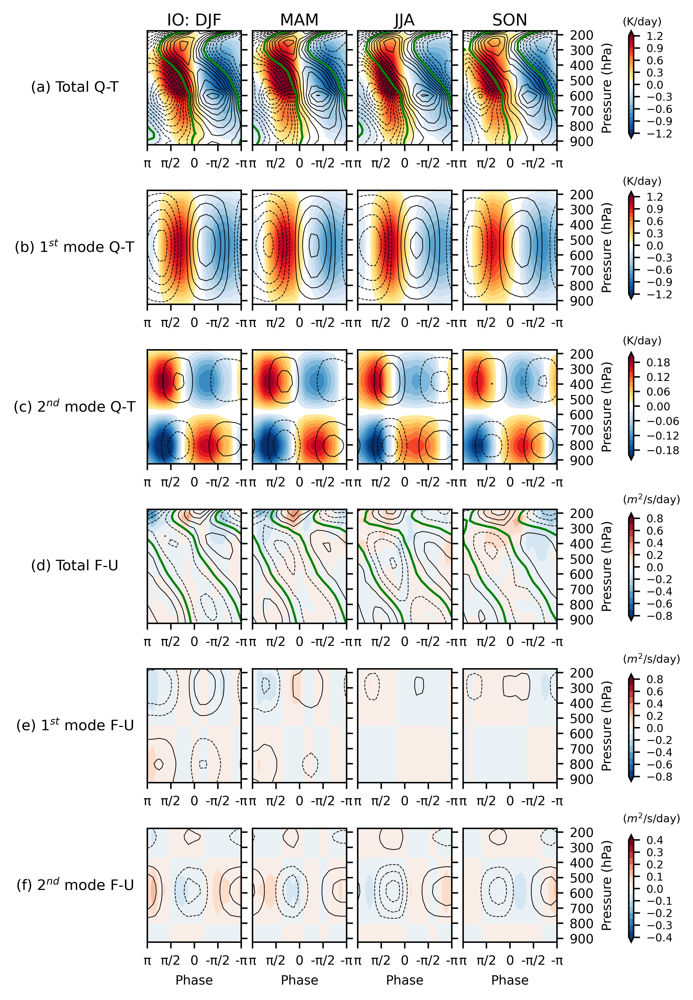

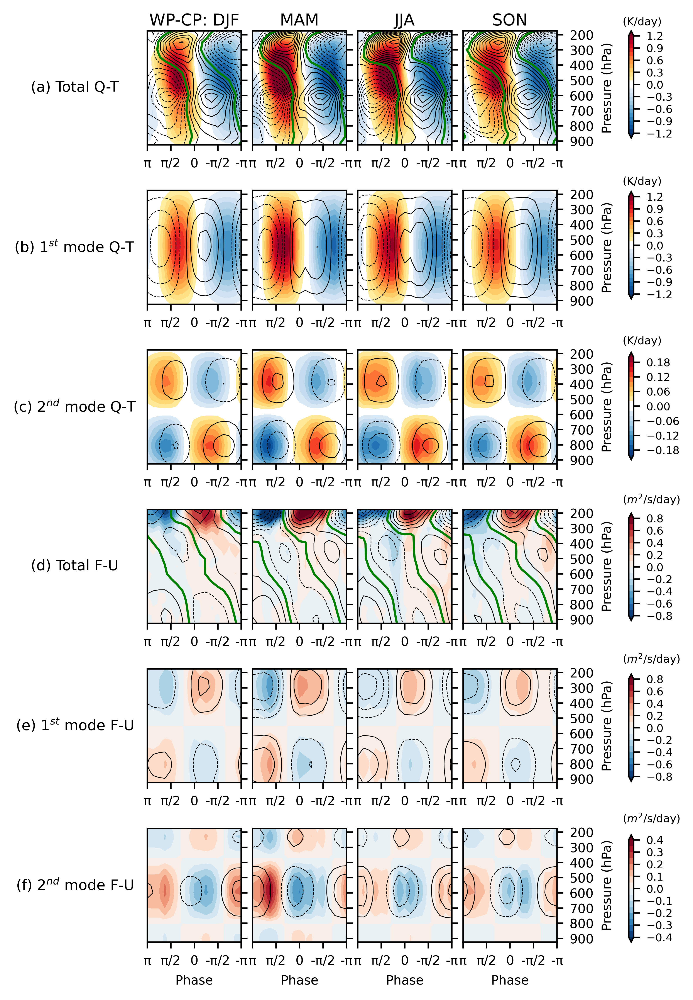

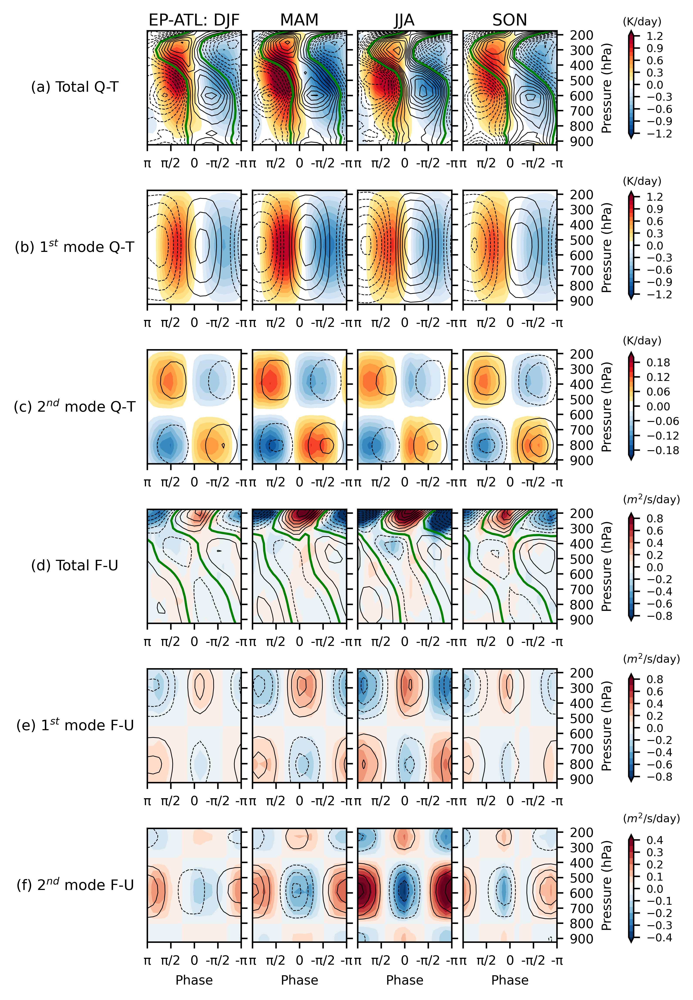

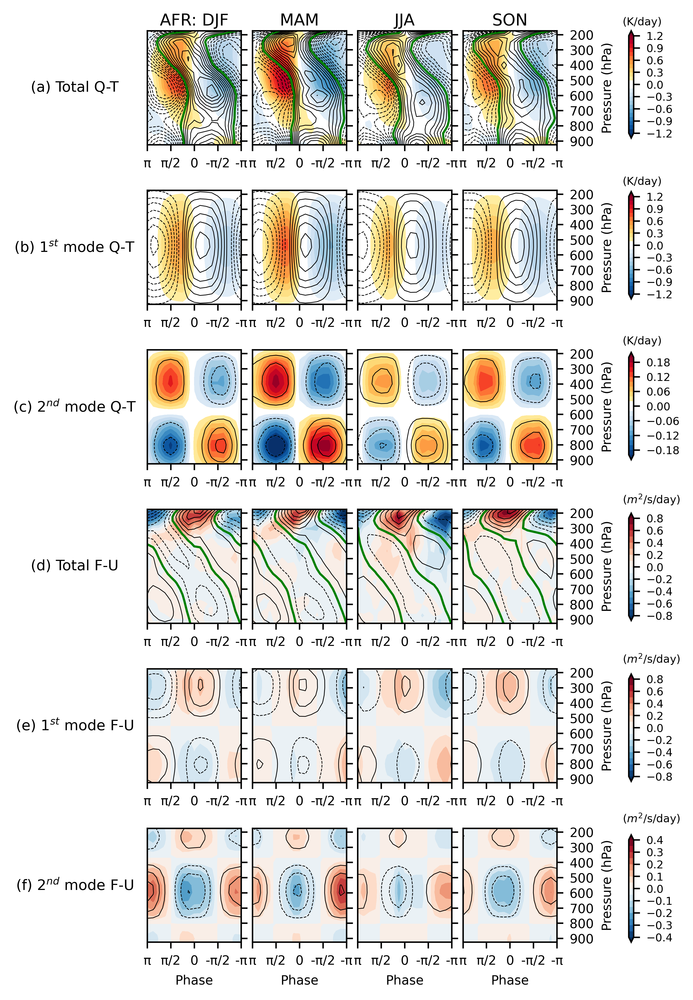

In [46]:
#########################################
# Fig. S3-7. Plot vertical mode decomposition: (4 seasons for each region)
###########################################
plot_fignum = 6 # or 5, if plot_fignum=5, plot extra panels for 1st+2nd modes and residual
txt_xloc = -8
txt_yloc = (np.min(plev)+np.max(plev))/2
row_name_QT = list(['(a) Total Q-T','(b) 1$^{st}$ mode Q-T','(c) 2$^{nd}$ mode Q-T'])
row_name_FU = list(['(d) Total F-U','(e) 1$^{st}$ mode F-U','(f) 2$^{nd}$ mode F-U'])
title_noabc = season
clev_0 = 0
font = 7
fig_indx = np.array([[5,17],[9,21]])


for ireg in range(0,nreg-1): 
    
    fig,axes = plt.subplots(plot_fignum,nsea-1,figsize=(5.5, 8.2),dpi=600)
    plt.subplots_adjust(left=0.23,right=0.8,top=0.95,bottom=0.1,hspace=0.4,wspace=0.12)
    plt.rcParams.update({'font.size': font})
    
    for iplt in range(0,2): #(iplt=0, QT, iplt=1, FU)

        if iplt == 0:
            clev_n = np.arange(-6,0,0.5)/20
            clev_p = np.arange(0.5,6.5,0.5)/20
            clev   = np.arange(-1.2,1.3,0.1) # Total
            clev2  = np.arange(-0.2,0.22,0.02) # 2nd mode
            var_cf  = globals()['Q_KW_small']
            var_cn  = globals()['T_KW_small']
            var1_cf = globals()['Q1_KW_small']
            var2_cf = globals()['Q2_KW_small']
            var1_cn = globals()['T1_KW_small']
            var2_cn = globals()['T2_KW_small']
        elif iplt == 1:
            clev_n = np.arange(-2.2,0,0.2)*1.5#*1.5#*1.5 #4.5,0,0.5)
            clev_p = np.arange(0.2,2.2,0.2)*1.5#*1.5#*1.5 #(0.5,5,0.5)    
            clev  = np.arange(-0.8,0.9,0.1) # Total
            clev2 = np.arange(-0.4,0.45,0.05) # 2nd mode
            var_cf = globals()['F_KW_small']*86400
            var_cn = globals()['U_KW_small']
            var1_cf = globals()['F1_KW_small']*86400
            var2_cf = globals()['F2_KW_small']*86400
            var1_cn = globals()['U1_KW_small']
            var2_cn = globals()['U2_KW_small']

        for i in range(0,nsea-1): #iseason

            # Total
            ifig = i+1+iplt*12
            plt.subplot(plot_fignum,nsea-1, ifig)
            ax = plt.gca()
            if iplt == 0 and i ==0:
                plt.title(region[ireg]+': '+title_noabc[i], pad=3, loc='center',fontsize=9)
            elif iplt == 0:
                plt.title(title_noabc[i], pad=3, loc='center',fontsize=9)
            xx, yy = np.meshgrid(phase, plev)
            if iplt == 0:
                cf  = plt.contourf(xx, yy, var_cf[:,:,ireg,i].T, levels=clev, cmap=get_cmap(RWB), extend='both' )
            else:
                cf  = plt.contourf(xx, yy, var_cf[:,:,ireg,i].T, levels=clev, cmap='RdBu_r', extend='both' )
            cn_p = plt.contour(xx, yy, var_cn[:,:,ireg,i].T, levels=clev_p, colors='k', linewidths=0.4)
            cn_0 = plt.contour(xx, yy, var_cn[:,:,ireg,i].T, levels=clev_0, colors='g', linewidths=1.2)
            cn_n = plt.contour(xx, yy, var_cn[:,:,ireg,i].T, levels=clev_n, colors='k', linestyles='dashed',linewidths=0.4)
            plt.ylim([np.min(plev),np.max(plev)])
            plt.yticks(np.arange(200,1000,100))
            plt.gca().invert_yaxis()
            plt.xticks(bin_simple2,(PI,PI+'/2','0','-'+PI+'/2','-'+PI),fontsize=font)
            #plt.xticks(bin_simple2,('-'+PI,'-'+PI+'/2','0',PI+'/2',PI),fontsize=font)
            plt.tick_params(bottom=True,top=False,left=False,right=True)
            if iplt == 0:
                row_name = row_name_QT[0]
            else:
                row_name = row_name_FU[0]
            if i == 0:
                plt.tick_params(labelbottom=True,labeltop=False,labelleft=False,labelright=False)
                plt.text(txt_xloc,txt_yloc,row_name,fontsize=8,horizontalalignment='center',verticalalignment='center') 
            elif i == 1 or i == 2:
                plt.tick_params(labelbottom=True,labeltop=False,labelleft=False,labelright=False)
            elif i == 3:
                plt.tick_params(labelbottom=True,labeltop=False,labelleft=False,labelright=True)
                ax.yaxis.set_label_position("right")
                ax.set_ylabel('Pressure (hPa)',fontsize=font)
        cb = plt.colorbar(cf,ax=axes[iplt*2,:],orientation = 'vertical', shrink=.6, aspect=20,pad=0.6) 
        if iplt == 0:
            cb.ax.set_position([0.9, 0.85, 0.4, 0.1]) 
        else:
            cb.ax.set_position([0.9, 0.4, 0.4, 0.1]) 
        cb.ax.tick_params(labelsize=6)   
        ax.text(1.7, 1.03, '('+unit[iplt]+')',\
            verticalalignment='bottom', horizontalalignment='left',transform=ax.transAxes,\
            color='k', fontsize=6) #unit of the colorbar
        
        for irow in range(0,2): # 1st or 2nd mode
            for i in range(0,nsea-1): #iseason
                # 1st or 2nd mode
                ifig = fig_indx[irow, iplt]
                plt.subplot(plot_fignum, nsea-1, ifig+i)
                ax = plt.gca()
                
                # 1st mode:
                if iplt == 0 and irow == 0:
                    cf  = plt.contourf(xx, yy, var1_cf[:,:,ireg,i].T, levels=clev, cmap=get_cmap(RWB), extend='both' )
                elif iplt == 1 and irow == 0:
                    cf  = plt.contourf(xx, yy, var1_cf[:,:,ireg,i].T, levels=clev, cmap='RdBu_r', extend='both' )
                
                # 2nd mode:
                if iplt == 0 and irow == 1:
                    cf  = plt.contourf(xx, yy, var2_cf[:,:,ireg,i].T, levels=clev2, cmap=get_cmap(RWB), extend='both' )
                elif iplt == 1 and irow == 1:
                    cf  = plt.contourf(xx, yy, var2_cf[:,:,ireg,i].T, levels=clev2, cmap='RdBu_r', extend='both' )

                if irow == 0:
                    cn_p = plt.contour(xx, yy, var1_cn[:,:,ireg,i].T, levels=clev_p, colors='k', linewidths=0.4)
                    cn_n = plt.contour(xx, yy, var1_cn[:,:,ireg,i].T, levels=clev_n, colors='k', linestyles='dashed',linewidths=0.4) 
                else:
                    cn_p = plt.contour(xx, yy, var2_cn[:,:,ireg,i].T, levels=clev_p, colors='k', linewidths=0.4)
                    cn_n = plt.contour(xx, yy, var2_cn[:,:,ireg,i].T, levels=clev_n, colors='k', linestyles='dashed',linewidths=0.4)                     
                
                plt.ylim([np.min(plev),np.max(plev)])
                plt.yticks(np.arange(200,1000,100))
                plt.gca().invert_yaxis()
                plt.xticks(bin_simple2,(PI,PI+'/2','0','-'+PI+'/2','-'+PI),fontsize=font)
                plt.tick_params(bottom=True,top=False,left=False,right=True)
                if iplt == 0:
                    row_name = row_name_QT[irow+1]
                else:
                    row_name = row_name_FU[irow+1]
                if i == 0:
                    plt.tick_params(labelbottom=True,labeltop=False,labelleft=False,labelright=False)
                    plt.text(txt_xloc,txt_yloc,row_name,fontsize=8,horizontalalignment='center',verticalalignment='center') 
                elif i == 1 or i == 2:
                    plt.tick_params(labelbottom=True,labeltop=False,labelleft=False,labelright=False)
                elif i == 3:
                    plt.tick_params(labelbottom=True,labeltop=False,labelleft=False,labelright=True)
                    ax.yaxis.set_label_position("right")
                    ax.set_ylabel('Pressure (hPa)',fontsize=font)
                if iplt == 1 and irow == 1:
                    plt.xlabel('Phase',fontsize=font)
            cb = plt.colorbar(cf,ax=axes[iplt*3+1+irow,:],orientation = 'vertical', shrink=.6, aspect=20,pad=0.6) 
            if iplt == 0 and irow == 0:
                cb.ax.set_position([0.9, 0.7, 0.4, 0.1]) 
            elif iplt == 0 and irow == 1:
                cb.ax.set_position([0.9, 0.55, 0.4, 0.1]) 
            elif iplt == 1 and irow == 0:
                cb.ax.set_position([0.9, 0.25, 0.4, 0.1]) 
            elif iplt == 1 and irow == 1:
                cb.ax.set_position([0.9, 0.1, 0.4, 0.1]) 
            cb.ax.tick_params(labelsize=6)
            ax.text(1.7, 1.03, '('+unit[iplt]+')',\
            verticalalignment='bottom', horizontalalignment='left',transform=ax.transAxes,\
            color='k', fontsize=6) #unit of the colorbar
    
    plt.savefig(fig_dir+'Fig.S4-7_QTFU_KW_1st_2nd_4season_'+region[ireg]+'.png',dpi=600)
    plt.show()    

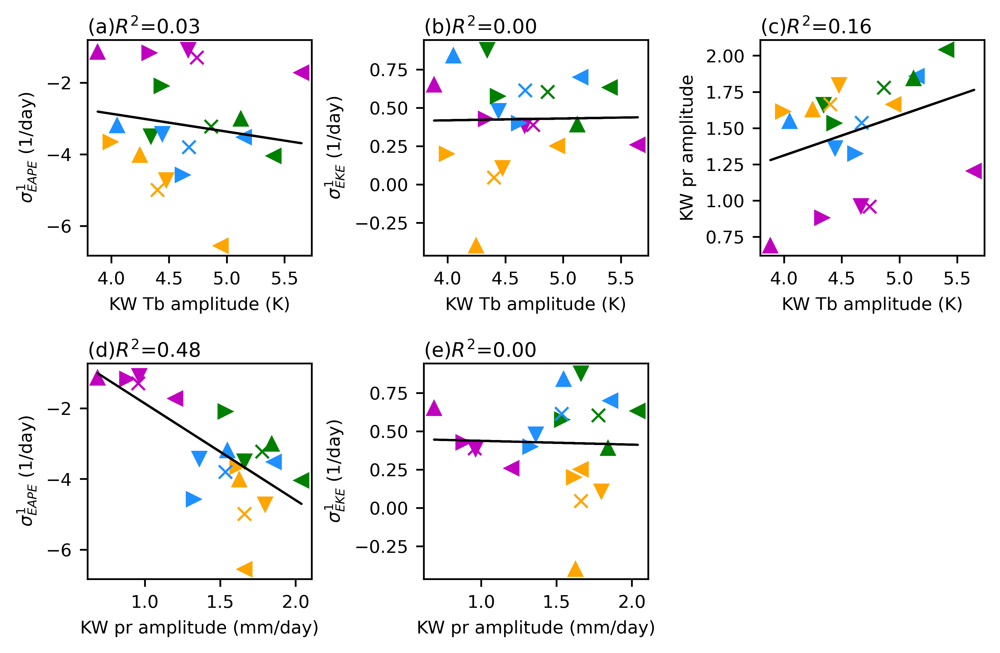

In [47]:
##########################
# Figure S8: Scatter plot between KW amplitude and EAPE/EKE growth rate of the first baroclinic mode
################################
# Plot 1st mode growth rate
Vx_list = list(['Tb_KW_amp','Tb_KW_amp','Tb_KW_amp','pr_KW_amp','pr_KW_amp'])
Vy_list = list(['EAPEGR1','EKEGR1','pr_KW_amp','EAPEGR1','EKEGR1'])
ylabel_list = list(['$\u03C3^{\t{1}}_{\t{EAPE}}$','$\u03C3^{\t{1}}_{\t{EKE}}$','KW pr amplitude',\
                   '$\u03C3^{\t{1}}_{\t{EAPE}}$','$\u03C3^{\t{1}}_{\t{EKE}}$'])
xlabel_list = list(['KW Tb amplitude (K)','KW Tb amplitude (K)','KW Tb amplitude (K)',\
                   'KW pr amplitude (mm/day)','KW pr amplitude (mm/day)'])
title_list  = list(['(a)','(b)','(c)','(d)','(e)'])

# Plot scatter plot
fig,axes = plt.subplots(2,3,figsize=(6.5, 4),dpi=600)
font = 8
plt.subplots_adjust(left=0.1,right=0.97,top=0.95,bottom=0.1,wspace=0.5,hspace=0.5)
plt.rcParams.update({'font.size': font})
marker_list = list(['v','<','^','>','x'])
for iplt in range(0,5):
    plt.subplot(2,3,iplt+1)
    Vx = globals()[Vx_list[iplt]]
    Vy = globals()[Vy_list[iplt]]
    ax = plt.gca()
    # Plot each season
    for isea in range(0,5):
        ax.plot(Vx[0,isea],Vy[0,isea],color='orange',marker=marker_list[isea], linestyle='')
        ax.plot(Vx[1,isea],Vy[1,isea],color='g',marker=marker_list[isea], linestyle='')
        ax.plot(Vx[2,isea],Vy[2,isea],color='dodgerblue',marker=marker_list[isea], linestyle='')
        ax.plot(Vx[3,isea],Vy[3,isea],color='m',marker=marker_list[isea], linestyle='')
    plt.tick_params(labelbottom=True,labeltop=False,labelleft=True,labelright=False)
    plt.xlabel(xlabel_list[iplt],fontsize=8)
    if iplt !=2 and iplt !=5:
        plt.ylabel(ylabel_list[iplt]+' (1/day)',fontsize=8)
    else:
        plt.ylabel(ylabel_list[iplt],fontsize=8)

    # Find slope between x and y
    x_flat = np.ndarray.flatten(Vx[:,:4])
    y_flat = np.ndarray.flatten(Vy[:,:4])

    x= sm.add_constant(x_flat)
    REGR = sm.OLS(y_flat,x)
    regr = REGR.fit()
    p = regr.params
    b = p[0]
    m = p[1]
    r = regr.rsquared
    bs= "{:.2f}".format(b.squeeze())
    ms = "{:.2f}".format(m.squeeze())
    rs = "{:.2f}".format(r.squeeze())
    ypred = x_flat*m+b
    plt.plot(x_flat,ypred, 'k', linewidth=1)
    plt.title(title_list[iplt]+'$R^{2}$='+rs, pad=3, loc='left',fontsize=9)
    
for ax in axes[1:,2]:
    ax.remove()
    
plt.savefig(fig_dir+'FigS8_KWAMP_GR1.png',dpi=600)
plt.show()
plt.close()

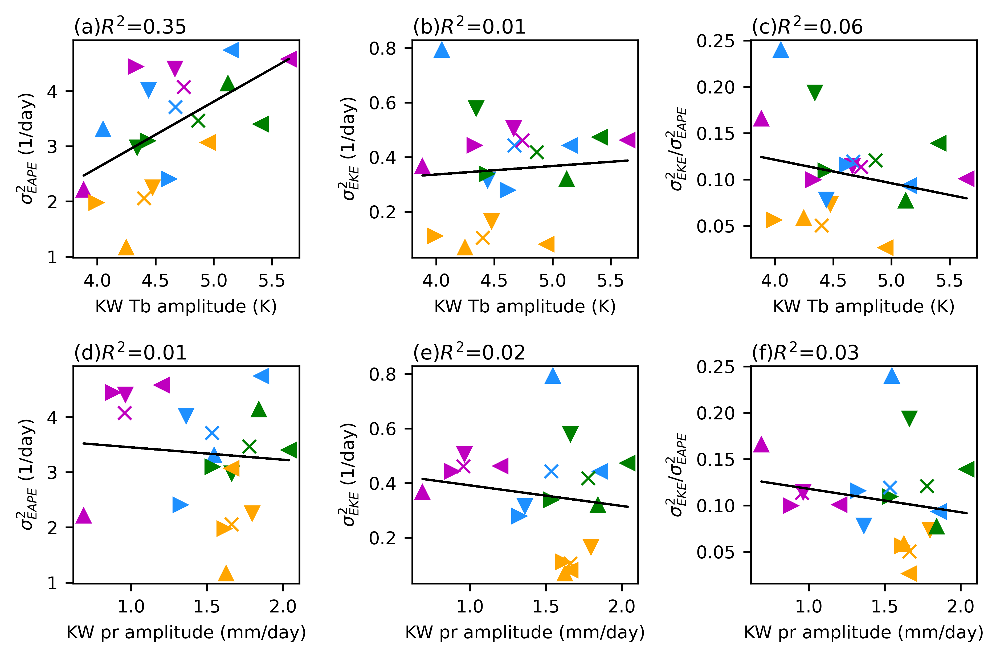

In [48]:
###################################################################
# Fig. S9. Scatter plot between KW amp in precip, Tb, and EAPE and EKE growth rate of the second mdoe
###################################################################

Vx_list = list(['Tb_KW_amp','Tb_KW_amp','Tb_KW_amp','pr_KW_amp','pr_KW_amp','pr_KW_amp'])
Vy_list = list(['EAPEGR2','EKEGR2','EKEGR2_EAPEGR2','EAPEGR2','EKEGR2','EKEGR2_EAPEGR2'])
ylabel_list = list(['$\u03C3^{\t{2}}_{\t{EAPE}}$','$\u03C3^{\t{2}}_{\t{EKE}}$','$\u03C3^{\t{2}}_{\t{EKE}}$/$\u03C3^{\t{2}}_{\t{EAPE}}$',\
                   '$\u03C3^{\t{2}}_{\t{EAPE}}$','$\u03C3^{\t{2}}_{\t{EKE}}$','$\u03C3^{\t{2}}_{\t{EKE}}$/$\u03C3^{\t{2}}_{\t{EAPE}}$'])
xlabel_list = list(['KW Tb amplitude (K)','KW Tb amplitude (K)','KW Tb amplitude (K)',\
                   'KW pr amplitude (mm/day)','KW pr amplitude (mm/day)','KW pr amplitude (mm/day)'])
title_list  = list(['(a)','(b)','(c)','(d)','(e)','(f)'])

# Plot scatter plot
fig,axes = plt.subplots(2,3,figsize=(6.5, 4),dpi=600)
font = 8
plt.subplots_adjust(left=0.1,right=0.97,top=0.95,bottom=0.1,wspace=0.5,hspace=0.5)
plt.rcParams.update({'font.size': font})
marker_list = list(['v','<','^','>','x'])
for iplt in range(0,6):
    #plt.subplot(2,2,iplt+1)
    plt.subplot(2,3,iplt+1)
    Vx = globals()[Vx_list[iplt]]
    Vy = globals()[Vy_list[iplt]]
    ax = plt.gca()
    # Plot each season
    for isea in range(0,5):
        ax.plot(Vx[0,isea],Vy[0,isea],color='orange',marker=marker_list[isea], linestyle='')
        ax.plot(Vx[1,isea],Vy[1,isea],color='g',marker=marker_list[isea], linestyle='')
        ax.plot(Vx[2,isea],Vy[2,isea],color='dodgerblue',marker=marker_list[isea], linestyle='')
        ax.plot(Vx[3,isea],Vy[3,isea],color='m',marker=marker_list[isea], linestyle='')
    plt.tick_params(labelbottom=True,labeltop=False,labelleft=True,labelright=False)
    plt.xlabel(xlabel_list[iplt],fontsize=8)
    if iplt !=2 and iplt !=5:
        plt.ylabel(ylabel_list[iplt]+' (1/day)',fontsize=8)
    else:
        plt.ylabel(ylabel_list[iplt],fontsize=8)
    
    # Find slope between x and y
    x_flat = np.ndarray.flatten(Vx[:,:4])
    y_flat = np.ndarray.flatten(Vy[:,:4])

    x= sm.add_constant(x_flat)
    REGR = sm.OLS(y_flat,x)
    regr = REGR.fit()
    p = regr.params
    b = p[0]
    m = p[1]
    r = regr.rsquared
    bs= "{:.2f}".format(b.squeeze())
    ms = "{:.2f}".format(m.squeeze())
    rs = "{:.2f}".format(r.squeeze())
    ypred = x_flat*m+b
    plt.plot(x_flat,ypred, 'k', linewidth=1)
    plt.title(title_list[iplt]+'$R^{2}$='+rs, pad=3, loc='left',fontsize=9)
    
plt.savefig(fig_dir+'FigS9_KWAMP_GR2_ratio.png',dpi=600)
plt.show()
plt.close()